# COVID-Getting Started

This is a simple kernel to show how to use this dataset, as well as explain its contents.

In [1]:
import glob
import pandas  as pd
import numpy   as np
import nibabel as nib
import matplotlib.pyplot as plt

To make things easier, I created a `metadata.csv` file with all the filepaths organized in it.

In [2]:
# Read and examine metadata
raw_data = pd.read_csv('.\input\covid19-ct-scans\metadata.csv')
raw_data.sample(5)

,ct_scan,lung_mask,infection_mask,lung_and_infection_mask
19,./input/covid19-ct-scans/ct_scans/radiopaedia_...,./input/covid19-ct-scans/lung_mask/radiopaedia...,./input/covid19-ct-scans/infection_mask/radiop...,./input/covid19-ct-scans/lung_and_infection_ma...
2,./input/covid19-ct-scans/ct_scans/coronacases_...,./input/covid19-ct-scans/lung_mask/coronacases...,./input/covid19-ct-scans/infection_mask/corona...,./input/covid19-ct-scans/lung_and_infection_ma...
18,./input/covid19-ct-scans/ct_scans/radiopaedia_...,./input/covid19-ct-scans/lung_mask/radiopaedia...,./input/covid19-ct-scans/infection_mask/radiop...,./input/covid19-ct-scans/lung_and_infection_ma...
9,./input/covid19-ct-scans/ct_scans/coronacases_...,./input/covid19-ct-scans/lung_mask/coronacases...,./input/covid19-ct-scans/infection_mask/corona...,./input/covid19-ct-scans/lung_and_infection_ma...
0,./input/covid19-ct-scans/ct_scans/coronacases_...,./input/covid19-ct-scans/lung_mask/coronacases...,./input/covid19-ct-scans/infection_mask/corona...,./input/covid19-ct-scans/lung_and_infection_ma...


The files are provided in NifTi format (\*.nii) to read it we'll make use of the `nibabel` package.

Note: images were rotated in the source, so we'll add `np.rot90` to account for that.

There are only two types of images here 10 images of lungs with CORONA Virus and 10 lungs with Pheumonia.  We really should have 10 healthy lungs added into the mix.

In [3]:
def read_nii(filepath):
    '''
    Reads .nii file and returns pixel array
    '''
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    return(array)

Let's examine a file and all available annotations

In [4]:
x=read_nii('./input/covid19-ct-scans/ct_scans/coronacases_org_001.nii')
x.shape

(512, 512, 301)

In [5]:
print(raw_data.loc[0,'ct_scan'])

./input/covid19-ct-scans/ct_scans/coronacases_org_001.nii


In [6]:
# Read sample
sample_ct   = read_nii(raw_data.loc[0,'ct_scan'])
sample_lung = read_nii(raw_data.loc[0,'lung_mask'])
sample_infe = read_nii(raw_data.loc[0,'infection_mask'])
sample_all  = read_nii(raw_data.loc[0,'lung_and_infection_mask'])

Note that `512x512` is the common resolution for ct images, also there are `301` slices in this ct scan.

In [7]:
# Examine Shape
sample_ct.shape

(512, 512, 301)

Now lets inspect the images, as well as annotations that we have available:

In [8]:
def plot_sample(array_list, color_map = 'nipy_spectral'):
    '''
    Plots and a slice with all available annotations
    '''
    fig = plt.figure(figsize=(18,15))

    plt.subplot(1,4,1)
    plt.imshow(array_list[0], cmap='bone')
    plt.title('Original Image')

    plt.subplot(1,4,2)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Lung Mask')

    plt.subplot(1,4,3)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[2], alpha=0.5, cmap=color_map)
    plt.title('Infection Mask')

    plt.subplot(1,4,4)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[3], alpha=0.5, cmap=color_map)
    plt.title('Lung and Infection Mask')

    plt.show()

There are 3 annotations available:
- Lung Segmentation (contains different values to account for left and right lung)
- Infection Segmentation (segmentation of radiological findings that could be COVID)
- Lung + Infection (for the sake of making it simplier)

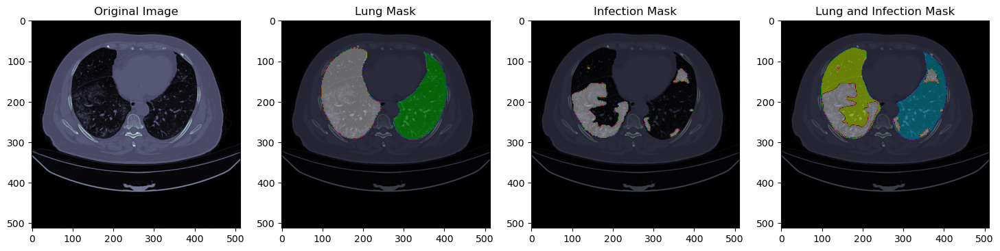

In [9]:
# Examine one slice of a ct scan and its annotations
plot_sample([sample_ct[...,120], sample_lung[...,120], sample_infe[...,120], sample_all[...,120]])

That's an example from a single slice, lets do the same for multiple slices in the same exam.

In [10]:
def bulk_plot_sample(array_list, index_list):
    '''
    Plots multiple slices, wrapper of plot_sample
    '''
    for index_value in index_list:
        plot_sample([array_list[0][...,index_value], array_list[1][...,index_value], array_list[2][...,index_value], array_list[3][...,index_value]])

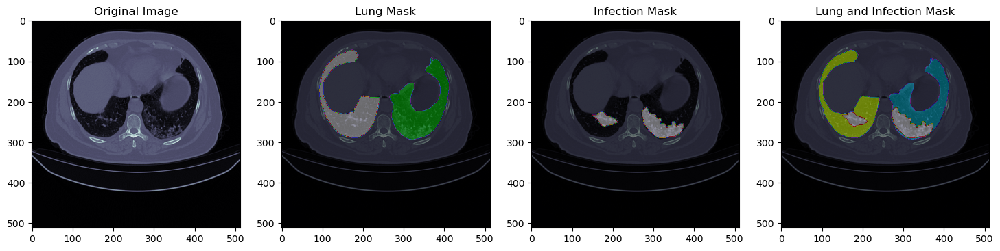

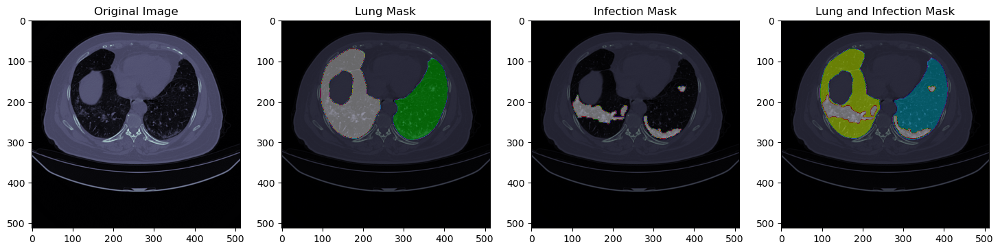

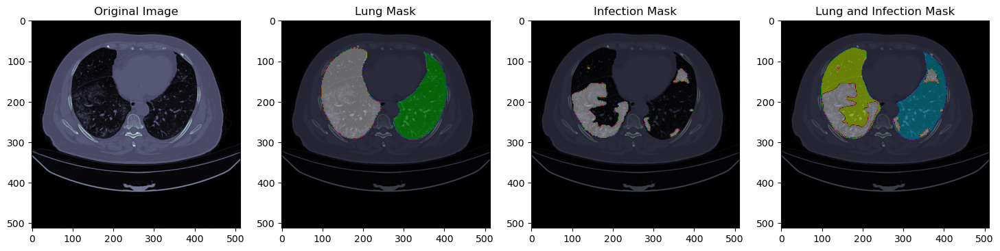

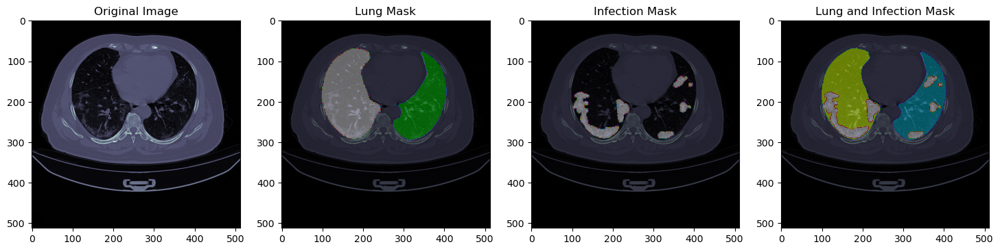

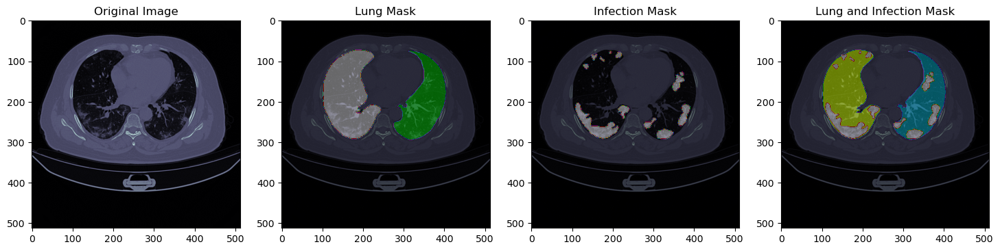

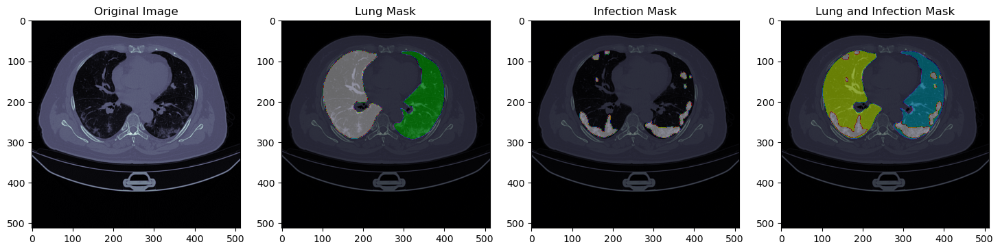

In [11]:
# Examine multiple slices of a ct scan and its annotations
bulk_plot_sample([sample_ct, sample_lung, sample_infe, sample_all], index_list=[100,110,120,130,140,150])

From here on you should be able to model the data to your hearts content!

For any requests let me know here in this kernel or in the discussion.

Thank you!

## Image processing

In [12]:
#Data handling
import pandas  as pd                          # already imported above
import numpy   as np                          # already imported above
import matplotlib.pyplot as plt               # already imported above
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, MeanShift
from sklearn.model_selection import train_test_split

#Image loading and processing
import nibabel as nib                         # already imported above
import cv2
import imgaug as ia
import imgaug.augmenters as iaa

#File system handling
import glob                                    # already imported above
from zipfile import ZipFile                     # Not used
from shutil import copyfile, copyfileobj        # Not used
import gzip                                     # Not used
import os
from pylab import rcParams
#from google.colab import drive                 #Only useful if we are doing this in colab or from colab
#from google.colab import files                 #Only useful if we are doing this in colab or from colab

#Data Analysis and Machine Learning
import tensorflow as tf
from tensorflow.keras import layers, models
import scipy


print("Tensor Flow Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("GPU is", "available" if tf.config.experimental.list_physical_devices("GPU") else "NOT AVAILABLE")

Tensor Flow Version:  2.10.0
Eager mode:  True
GPU is available


In [13]:
import sys
import random
import warnings
import math
import seaborn as sns; sns.set()

from tqdm import tqdm_notebook, tnrange
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

from tensorflow import keras
from keras.callbacks import Callback
from keras.losses import binary_crossentropy, sparse_categorical_crossentropy
from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose, Conv3D, Conv3DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D, MaxPooling3D, GlobalMaxPool3D
from keras.layers.merge import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator #,img_to_array, array_to_img , load_img are supposed to be in this mix but I got errors
from keras import backend as K

import joblib
import gc
import segmentation_models as sm

Segmentation Models: using `keras` framework.


In [14]:
import sys

print("User Python Current Version:-", sys.version)

User Python Current Version:- 3.7.13 (default, Mar 28 2022, 08:03:21) [MSC v.1916 64 bit (AMD64)]


## Keras Model Callback Def

In [15]:
# Define the Keras model to add callbacks to
def get_model():
    model = keras.Sequential()
    model.add(keras.layers.Dense(1, input_dim=784))
    model.compile(
        optimizer=keras.optimizers.RMSprop(learning_rate=0.1),
        loss="mean_squared_error",
        metrics=["mean_absolute_error"],
    )
    return model

In [17]:
# Define Sequential model with 3 layers
model = keras.Sequential(
    [
        layers.Dense(2, activation="relu", name="layer1"),
        layers.Dense(3, activation="relu", name="layer2"),
        layers.Dense(4, name="layer3"),
    ]
)
# Call model on a test input
x = tf.ones((3, 3))
y = model(x)

## CLAHE and Cropping for image cleaning

In [15]:
def clahe_enhancer(test_img, demo):
    ''' CLAHE is contrast limited adaptive histogram equalization.  
    This will take local areas of an image and use an adaptive equalization
    of the brightness of the local area.  It will enhance edges and help 
    remove asymetric bright areas of an image improving the ability to see
    details within.'''

    test_img = test_img*255
    test_img = np.uint8(test_img)
    test_img_flattened = test_img.flatten()
  
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8)) #Creates the CLAHE 8x8 pixel window
    clahe_image = clahe.apply(test_img)
    clahe_image_flattened = clahe_image.flatten()

    if demo == 1:

        fig = plt.figure()
        rcParams['figure.figsize'] = 10,10

        plt.subplot(2, 2, 1)
        plt.imshow(test_img, cmap='bone')
        plt.title("Original CT-Scan")

        plt.subplot(2, 2, 2)
        plt.hist(test_img_flattened)
        plt.title("Histogram of Original CT-Scan")

        plt.subplot(2, 2, 3)
        plt.imshow(clahe_image, cmap='bone')
        plt.title("CLAHE Enhanced CT-Scan")

        plt.subplot(2, 2, 4)
        plt.hist(clahe_image_flattened)
        plt.title("Histogram of CLAHE Enhanced CT-Scan")

    return(clahe_image)

In [16]:
def cropper(test_img, demo):
    ''' The cropper is a way to remove balck space in "uninteresting areas of an image so we can
    save on computing and memory for doing our analysis.  We are only in this instance interested
    in the lungs for example."'''

    test_img = test_img*255
    test_img = np.uint8(test_img)

    ret, thresh = cv2.threshold(test_img, 50, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) 
    ret, thresh = cv2.threshold(test_img, ret, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) 

    contours,hierarchy = cv2.findContours(test_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    areas = [cv2.contourArea(c) for c in contours]

    x = np.argsort(areas)

    max_index = x[x.size - 1]
    cnt1=contours[max_index]
    second_max_index = x[x.size - 2]
    cnt2 = contours[second_max_index]
    
    cropped_image_flattened = test_img.flatten()


    # max_index = np.argmax(areas)
    # cnt=contours[max_index]

    x,y,w,h = cv2.boundingRect(cnt1)
    p,q,r,s = cv2.boundingRect(cnt2)

    cropped1 = test_img[y:y+h, x:x+w]
    cropped1 = cv2.resize(cropped1, dsize=(125,250), interpolation=cv2.INTER_AREA)
    cropped2 = test_img[q:q+s, p:p+r]
    cropped2 = cv2.resize(cropped2, dsize=(125,250), interpolation=cv2.INTER_AREA)

    fused = np.concatenate((cropped1, cropped2), axis=1)

    # super_cropped = test_img[y+7:y+h-20, x+25:x+w-25]
    points_lung1 = []
    points_lung2 = []

    points_lung1.append(x); points_lung1.append(y); points_lung1.append(w); points_lung1.append(h)
    points_lung2.append(p); points_lung2.append(q); points_lung2.append(r); points_lung2.append(s)

    if demo == 1:

        fig = plt.figure()
        from pylab import rcParams
        rcParams['figure.figsize'] = 35, 35

        plt.subplot(1, 3, 1)
        plt.imshow(test_img, cmap='bone')
        plt.title("Cropped CT-Scan")

        plt.subplot(1, 3, 2)
        plt.imshow(thresh, cmap='bone')
        plt.title("Binary Mask")
        
        #plt.subplot(1, 3, 3)
        #plt.imshow(fused, cmap='bone')
        #plt.title("Fused Image")

    #     plt.show()

    return(fused, points_lung1, points_lung2)

* Total slices are 3520. These have been sliced out by 20% in the front and by 20% in the last of each file since in general these didn't had any infection masks and some didn't had the lungs, removed as noise. This level could be adjusted too.

In [17]:
# Image Size is the preferred size of image that you wish to work with
img_size = 512

In [18]:
def read_nii_demo(filepath, data):
    '''
    Reads .nii file and returns pixel array
    '''
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    slices = array.shape[2]
    array = array[:,:,round(slices*0.2):round(slices*0.8)]
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1], 1))

    for img_no in range(0, array.shape[0]):
        # array = Image.resize(array[...,img_no], (img_size,img_size))
        img = cv2.resize(array[img_no], dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)
        data.append(img)

In [19]:
all_points1 = []
all_points2 = []

def read_nii(filepath, data, string):
    '''
    Reads .nii file and returns pixel array

    '''
    global all_points1
    global all_points2
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array)) # The images are rotated 90 degrees so we rotate them
    slices = array.shape[2]
    array = array[:,:,round(slices*0.1):round(slices*0.9)] # takes off the top and bottom 10%
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1],1))
    #print(array.shape[2])
    #array = skimage.transform.resize(array, (array.shape[2], img_size, img_size))
    #array = cv2.resize(array, dsize=(img_size, img_size), interpolation=cv2.INTER_CUBIC)
    

    if string == "lungs":
        all_points1 = []
        all_points2 = []

    for img_no in range(0, array.shape[0]):
        if string == 'lungs' and np.unique(array[img_no]).size == 1:
            continue
        img = cv2.resize(array[img_no], dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)

        if string == 'lungs': # not sure what this is doing but it's not working.
            #img = np.uint8(img*255) 
            img[img>0]=1
            img, points1, points2 = cropper(img, demo = 0)
            all_points1.append((points1[0], points1[1], points1[2], points1[3]))
            all_points2.append((points2[0], points2[1], points2[2], points2[3]))
            continue 

            
        if string == "cts" and img_no < len(all_points1):
            img = clahe_enhancer(img, demo = 0)
            # img, points1, points2 = cropper(img, demo = 0)
            # all_points1.append((points1[0], points1[1], points1[2], points1[3]))
            # all_points2.append((points2[0], points2[1], points2[2], points2[3]))   
            a,b,c,d = all_points1[img_no]
            e,f,g,h = all_points2[img_no]
            img1 = img[b:b+d, a:a+c]
            img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA) # Resize the axis to 250
            img2 = img[f:f+h, e:e+g]
            img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA) # Resize the other axis 250
            img = np.concatenate((img1, img2), axis=1)    

        if string == "infections" and img_no < len(all_points1):
            a,b,c,d = all_points1[img_no]
            e,f,g,h = all_points2[img_no]
            img = np.uint8(img*255)
            img1 = img[b:b+d, a:a+c]
            img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
            img2 = img[f:f+h, e:e+g]
            img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
            img = np.concatenate((img1, img2), axis=1)


        # img = cv2.resize(img, dsize=(192, 192), interpolation=cv2.INTER_LINEAR)
        # img = img/255
        #  remember to normalize again
        # also resize images and masks for all
        
        data.append(img)

In [20]:
cts = []
lungs = []
infections = []

In [21]:
for i in range(0, 20):
    read_nii(raw_data.loc[i,'lung_mask'], lungs, 'lungs')
    read_nii(raw_data.loc[i,'ct_scan'], cts, 'cts') 
    read_nii(raw_data.loc[i,'infection_mask'], infections, 'infections')

C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide


In [22]:
print("cts shape:",np.shape(cts))
print("infections shape:",np.shape(infections))
print("lungs shape:",np.shape(lungs))

cts shape: (2816,)
infections shape: (2816,)
lungs shape: (0,)


C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


<p color='red'>Lungs folder isn't working... need to find out why.</p>

* The issue with this data is that it pools all the slungs into one variable.  This is okay for 2D analysis but we need to do this in 3D

* The following is a fully processed sample

(250, 250) (250, 250)


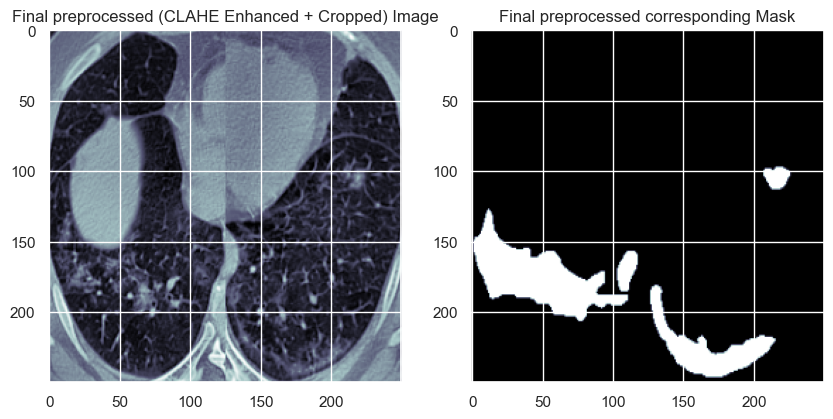

In [23]:
x = 80
rcParams['figure.figsize'] = 10,10

plt.subplot(1, 2, 1)
plt.imshow(cts[x], cmap='bone')
plt.title("Final preprocessed (CLAHE Enhanced + Cropped) Image")

plt.subplot(1, 2, 2)
plt.imshow(infections[x], cmap='bone')
plt.title("Final preprocessed corresponding Mask")

print(cts[x].shape, infections[x].shape)

(250, 250) (250, 250)


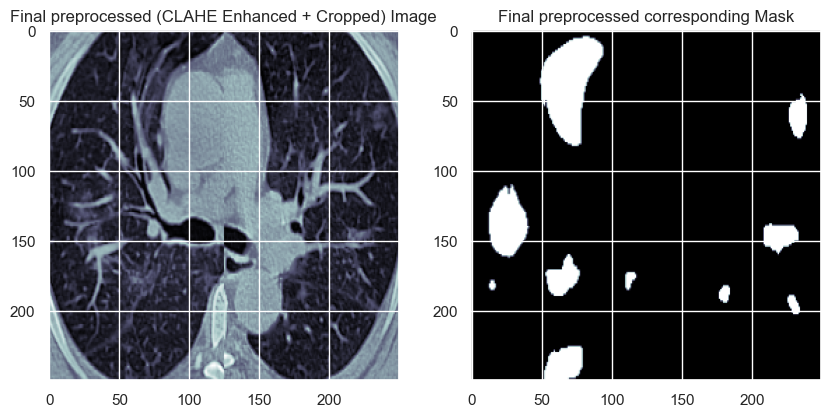

In [24]:
x = 120
rcParams['figure.figsize'] = 10,10

plt.subplot(2, 2, 1)
plt.imshow(cts[160], cmap='bone')
plt.title("Final preprocessed (CLAHE Enhanced + Cropped) Image")

plt.subplot(2, 2, 2)
plt.imshow(infections[160], cmap='bone')
plt.title("Final preprocessed corresponding Mask")

#plt.subplot(2, 2, 3)
#plt.imshow(lungs[80], cmap='bone')
#plt.title("Lung  Mask")
print(cts[x].shape, infections[x].shape)

In [25]:
no_masks = []
for i in range(0, len(infections)):
    if np.unique(infections[i]).size == 1:
        no_masks.append(i)
print("Number of complete black masks :" , len(no_masks))

for index in sorted(no_masks, reverse = True):  
    del infections[index]  
    del cts[index]

Number of complete black masks : 1006


Looking at this it appears that ~1000 slices were of complete black masks i.e. no infection.

* Following is the demo for the CLAHE enhanced images with histograms.  This stands for **C**ontrast **L**imitd **A**daptive **H**istogram **E**qualization.
* This enhances local contrast but limits the adaptive histogram equalization to not over amplify signal.
* Notice how the seahorse shaped infection in the left lung can be distinguised clearly after enhancement.

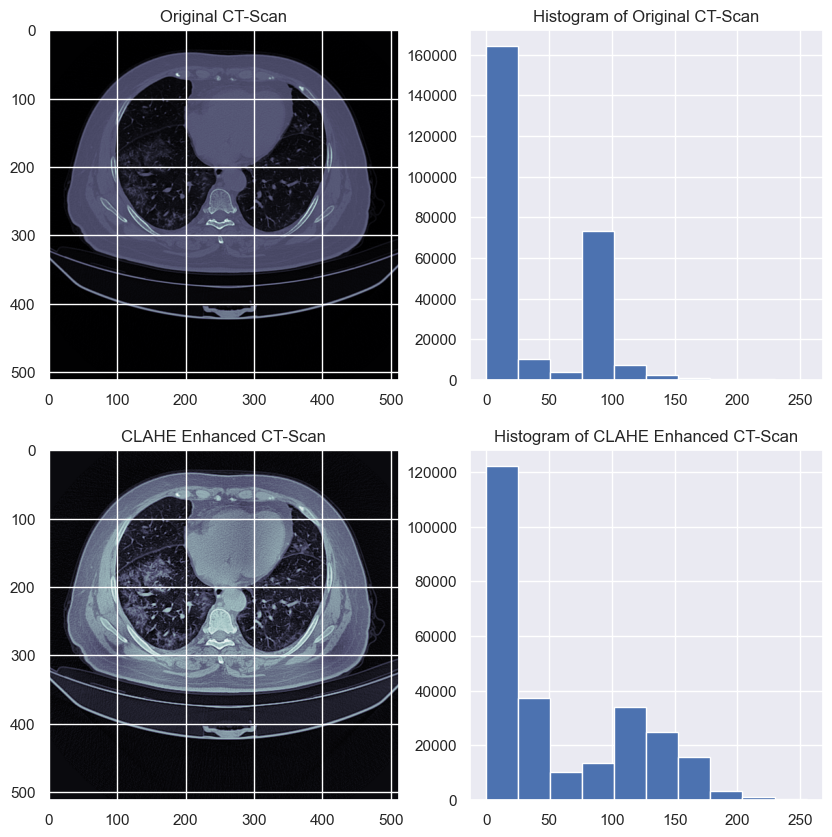

In [26]:
test_file = []
read_nii_demo(raw_data.loc[0,'ct_scan'], test_file)
test_file = np.array(test_file)
rcParams['figure.figsize'] = 10, 10
clahe_image = clahe_enhancer(test_file[60], demo = 1)

In [27]:
print(len(cts) , len(infections))

1810 1810


In [28]:
dim1=[]
dim2=[]
for i in range(0, len(cts)):
    dim1.append(cts[i].shape[0])
    dim2.append(cts[i].shape[1])
dim1 = np.array(dim1)
dim2 = np.array(dim2)

print("An idea about the new net dimension to which all must be resized to \n(some will increase and some decrease) --->", np.median(dim1),'x', np.median(dim2))

An idea about the new net dimension to which all must be resized to 
(some will increase and some decrease) ---> 250.0 x 250.0


In [29]:
#Used median of the all width and height but couldn't fit the RAM so reduced the size to 224, 
#though images with larger resolution with more clear features will possibly give better results on the same model.

new_dim = 224
for i in range(0,len(cts)):
    cts[i] = cv2.resize(cts[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
  # cts[i] = cts[i]/255
    infections[i] = cv2.resize(infections[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
  # infections[i] = infections[i]/255

In [30]:
# Saving the numpy arrays to later reuse the same preprocessing for other models 
# rather than doing it again and again.
cts = np.array(cts)
infections = np.array(infections)

cts = np.uint8(cts)
infections = np.uint8(infections)

In [31]:
joblib.dump(cts, 'cts_cropped_lungs_224.pkl')

['cts_cropped_lungs_224.pkl']

In [32]:
joblib.dump(infections, 'infections_cropped_lungs_224.pkl')

['infections_cropped_lungs_224.pkl']

### Randomly flip and rotate the image. 

This is to ensure the detection works in different orientations which can be an issue with image detection if the images are all ligned up the same way.

In [32]:
sometimes = lambda aug: iaa.Sometimes(0.5, aug)

seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontally flip 50% of all images
    iaa.Flipud(0.2), # vertically flip 20% of all images
    sometimes(iaa.Affine(
            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
            translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
            rotate=(-40, 40), # rotate by -45 to +45 degrees
            shear=(-16, 16), # shear by -16 to +16 degrees
            # mode=ia.ALL # use any of scikit-image's warping modes (see 2nd image from the top for examples)
        ))
], random_order=True)

In [40]:
cts.shape

(1614, 224, 224)

In [33]:
no_of_aug_imgs = 200
random_indices = np.random.randint(0, cts.shape[0], size=no_of_aug_imgs)
sample_cts = cts[random_indices]
sample_inf = infections[random_indices]

In [ ]:
# sample_cts = np.floor(sample_cts)
# sample_inf = np.floor(sample_inf)
# sample_cts = np.uint64(sample_cts)
# sample_inf = np.uint64(sample_inf)

In [42]:
print('sample_cts shape=',sample_cts.shape)
print('sample_inf shape=',sample_inf.shape)

sample_cts shape= (200, 224, 224)
sample_inf shape= (200, 224, 224)


In [44]:
cts_aug, infections_aug = seq(images=sample_cts, segmentation_maps=sample_inf)

ValueError: Tried to convert an array to list of SegmentationMapsOnImage. Expected that array to be of shape (N,H,W,#SegmapsPerImage), i.e. 4-dimensional, but got 3 dimensions instead.

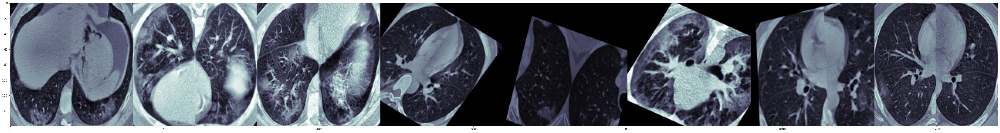

In [ ]:
rcParams['figure.figsize'] = 60,60
rand = np.random.randint(0, no_of_aug_imgs, size=8)

cells1 = cts_aug[rand]
grid_image1 = np.hstack(cells1)
plt.imshow(grid_image1, cmap = 'bone')

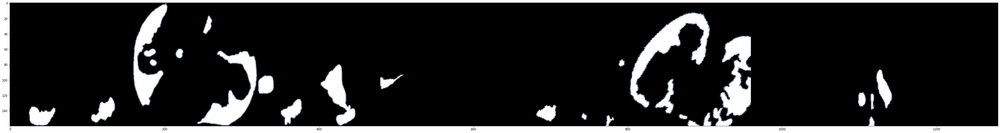

In [ ]:
cells2 = infections_aug[rand]
grid_image2 = np.hstack(cells2)
plt.imshow(grid_image2, cmap = 'bone')

In [ ]:
print(cts_aug.shape, infections_aug.shape)

(200, 160, 160) (200, 160, 160)


In [ ]:
# cts = np.concatenate((cts, cts_aug), axis=0)
# infections = np.concatenate((infections, infections_aug), axis = 0)
# np.random.shuffle(cts)
# np.random.shuffle(infections)
# print(cts.shape, infections.shape)

In [ ]:
cts_aug = cts_aug/255
infections_aug = infections_aug/255
cts_aug = cts_aug.reshape(len(cts_aug), new_dim, new_dim, 1)
infections_aug = infections_aug.reshape(len(infections_aug), new_dim, new_dim, 1)

## Data analysis

In [ ]:
# temp1 = joblib.load('cts_cropped_lungs_224.pkl')
# temp2 = joblib.load('infections_cropped_lungs_224.pkl')

In [31]:
# Normalizing the data
cts = cts/255
infections = infections/255

In [32]:
# Separating out test vs training data
from sklearn.model_selection import train_test_split


cts = cts.reshape(len(cts), new_dim, new_dim, 1)
infections = infections.reshape(len(infections), new_dim, new_dim, 1)

X=cts # CLAHE enhanced cropped lung data
y=infections # Infection mask for training

x_train, x_valid, y_train, y_valid = train_test_split(X, y, test_size=0.3, random_state=42) # random_state used for reproducibility
print(x_train.shape, x_valid.shape)
print(y_train.shape, y_valid.shape)

(1267, 224, 224, 1) (543, 224, 224, 1)
(1267, 224, 224, 1) (543, 224, 224, 1)


(Z,X,Y,C) as far as I can figure out.  But Z is actually all the images stacked together not caring if they are from one of the 20 images.

In [33]:
# Lets take a look at these and images and see what we have
def plot_sample(array_list, color_map = 'nipy_spectral'):
    '''
    Plots and a slice with all available annotations
    '''
    fig = plt.figure(figsize=(10,30))

    plt.subplot(1,2,1)
    plt.imshow(array_list[0].reshape(new_dim, new_dim), cmap='bone')
    plt.title('Original Image')

    # plt.subplot(1,2,2)
    # plt.imshow(array_list[0], cmap='bone')
    # plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    # plt.title('Lung Mask')

    plt.subplot(1,2,2)
    plt.imshow(array_list[0].reshape(new_dim, new_dim), cmap='bone')
    plt.imshow(array_list[1].reshape(new_dim, new_dim), alpha=0.5, cmap=color_map)
    plt.title('Infection Mask')

    # plt.subplot(1,2,2)
    # plt.imshow(array_list[0].reshape(img_size,img_size), cmap='bone')
    # plt.imshow(array_list[1].reshape(img_size, img_size), alpha=0.5, cmap=color_map)
    # plt.title('Lung and Infection Mask')

#     plt.subplot(1,4,4)
#     plt.imshow(array_list[0], cmap='bone')
#     plt.imshow(array_list[3], alpha=0.5, cmap=color_map)
#     plt.title('Lung and Infection Mask')

    plt.show()

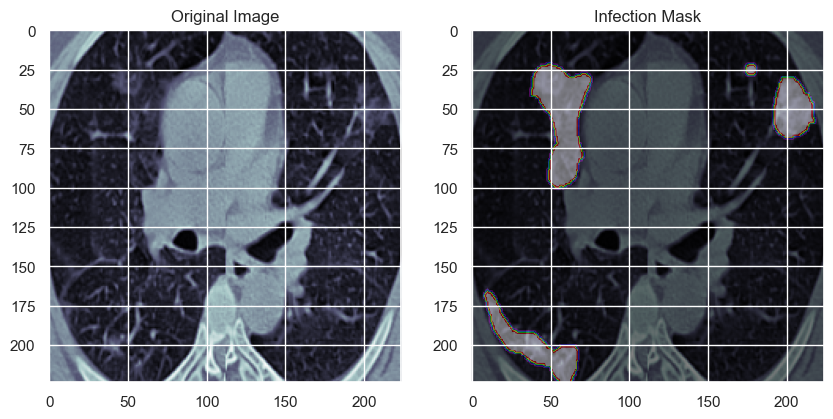

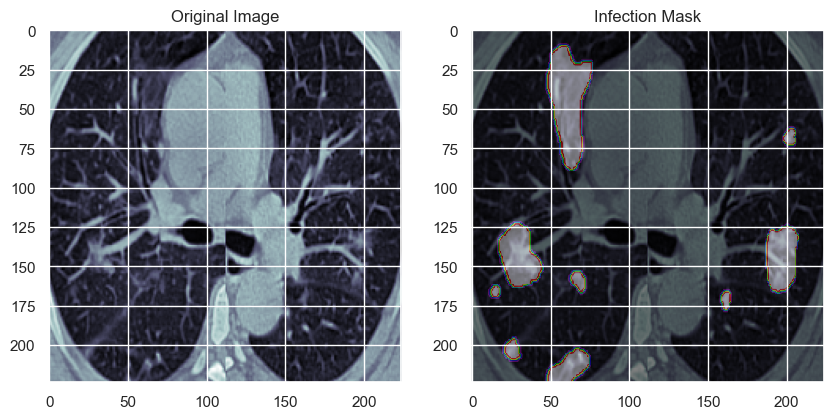

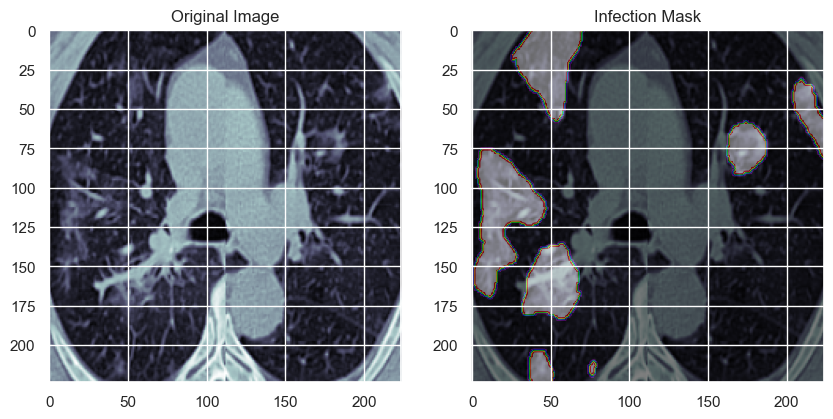

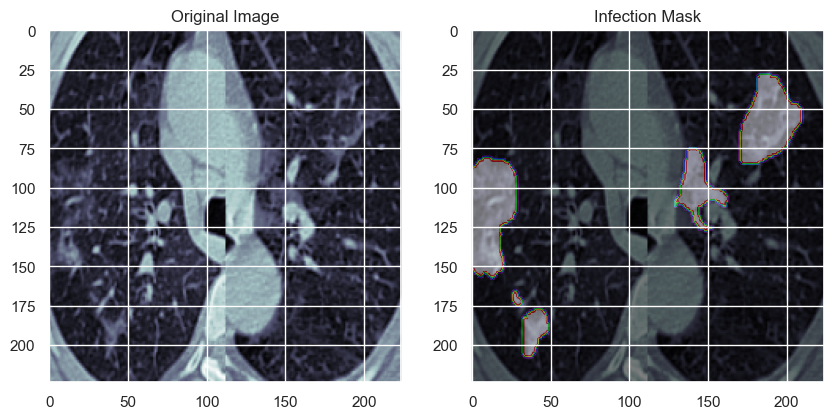

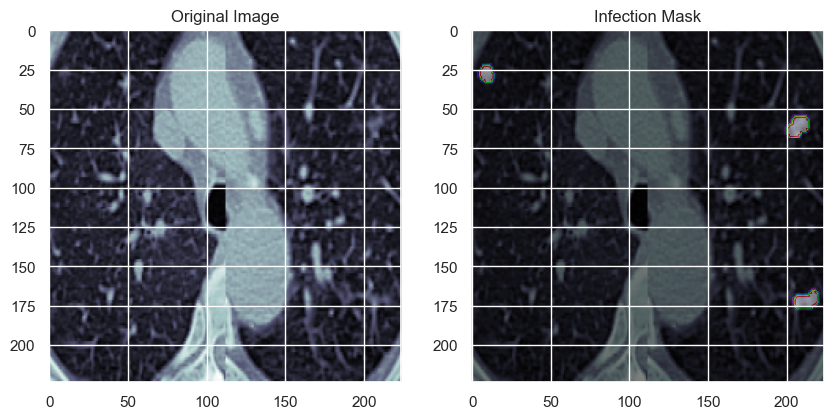

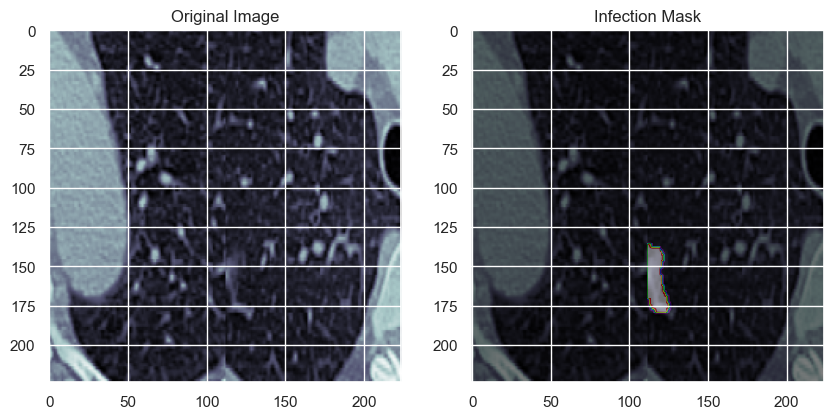

In [34]:
for index in [100,110,120,130,140,150]:
    plot_sample([cts[index], infections[index]])

In [ ]:
plot_sample(cts[[80]],infections[[80]])

## 2D analysis

In [35]:
# Some preformance metrics
def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss


def bce_dice_loss(y_true, y_pred):
    loss = 0.5*binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)
    return loss

def tversky_loss(y_true, y_pred):
    alpha = 0.5
    beta  = 0.5
    
    ones = K.ones(K.shape(y_true))
    p0 = y_pred      # proba that voxels are class i
    p1 = ones-y_pred # proba that voxels are not class i
    g0 = y_true
    g1 = ones-y_true
    
    num = K.sum(p0*g0, (0,1,2))
    den = num + alpha*K.sum(p0*g1,(0,1,2)) + beta*K.sum(p1*g0,(0,1,2))
    
    T = K.sum(num/den) # when summing over classes, T has dynamic range [0 Ncl]
    
    Ncl = K.cast(K.shape(y_true)[-1], 'float32')
    return Ncl-T

def weighted_bce_loss(y_true, y_pred, weight):
    epsilon = 1e-7
    y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
    logit_y_pred = K.log(y_pred / (1. - y_pred))
    loss = weight * (logit_y_pred * (1. - y_true) + 
                     K.log(1. + K.exp(-K.abs(logit_y_pred))) + K.maximum(-logit_y_pred, 0.))
    return K.sum(loss) / K.sum(weight)

def weighted_dice_loss(y_true, y_pred, weight):
    smooth = 1.
    w, m1, m2 = weight, y_true, y_pred
    intersection = (m1 * m2)
    score = (2. * K.sum(w * intersection) + smooth) / (K.sum(w * m1) + K.sum(w * m2) + smooth)
    loss = 1. - K.sum(score)
    return loss

def weighted_bce_dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    # if we want to get same size of output, kernel size must be odd
    averaged_mask = K.pool2d(
            y_true, pool_size=(50, 50), strides=(1, 1), padding='same', pool_mode='avg')
    weight = K.ones_like(averaged_mask)
    w0 = K.sum(weight)
    weight = 5. * K.exp(-5. * K.abs(averaged_mask - 0.5))
    w1 = K.sum(weight)
    weight *= (w0 / w1)
    loss = 0.5*weighted_bce_loss(y_true, y_pred, weight) + 0.5*dice_loss(y_true, y_pred)
    return loss

In [36]:
inputs = Input((new_dim, new_dim, 1))
# s = Lambda(lambda x: x / 255) (inputs)

# def mish(inputs):
#     return inputs * tf.math.tanh(tf.math.softplus(inputs))
    
c1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (inputs)
c1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c1)
c1 = BatchNormalization()(c1)
p1 = MaxPooling2D((2, 2)) (c1)
p1 = Dropout(0.25)(p1)

c2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p1)
c2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c2)
c2 = BatchNormalization()(c2)
p2 = MaxPooling2D((2, 2)) (c2)
p2 = Dropout(0.25)(p2)

c3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p2)
c3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c3)
c3 = BatchNormalization()(c3)
p3 = MaxPooling2D((2, 2)) (c3)
p3 = Dropout(0.25)(p3)

c4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p3)
c4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c4)
c4 = BatchNormalization()(c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
p4 = Dropout(0.25)(p4)

c5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p4)
c5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c5)

u6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = concatenate([u6, c4])
u6 = BatchNormalization()(u6)
c6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u6)
c6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c6)


u7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
u7 = BatchNormalization()(u7)
c7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u7)
c7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c7)


u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
u8 = BatchNormalization()(u8)
c8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u8)
c8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c8)


u9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
u9 = BatchNormalization()(u9)
c9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u9)
c9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 224, 224, 32  320         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 224, 224, 32  9248        ['conv2d[0][0]']                 
                                )                                                             

In [37]:
z = []
y = []
def step_decay(epoch):
    initial_lrate = 0.0008
    drop = 0.8
    epochs_drop = 10
    lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
    lrate_ = initial_lrate * math.pow(drop, (1+epoch)/epochs_drop)
    # print('New learning rate', lrate)
    z.append(lrate)
    y.append(lrate_)
    # return lrate

# lrate = LearningRateScheduler(step_decay)

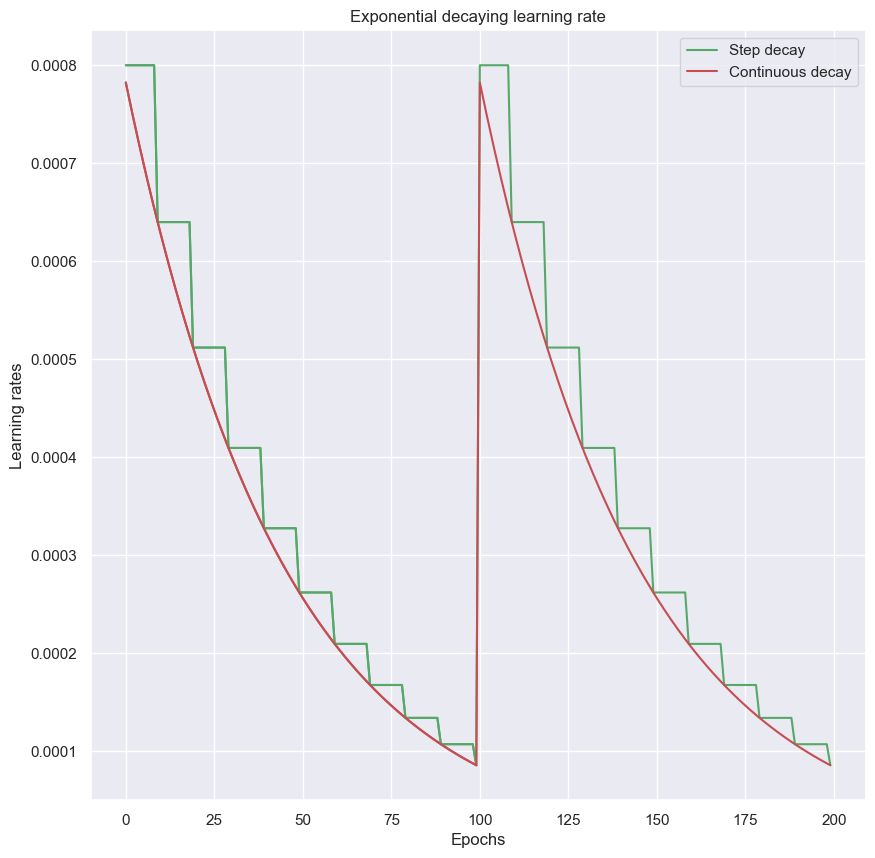

In [38]:
for i in range(2):
    for i in range(100):
        step_decay(i)
    plt.grid('True')
    plt.title("Exponential decaying learning rate")
    plt.xlabel('Epochs')
    plt.ylabel('Learning rates')
    plt.plot(np.array(z), color='g')
    plt.plot(np.array(y), color='r')
    plt.legend(['Step decay', 'Continuous decay'])

In [39]:
class CosineAnnealingScheduler(Callback):
    """Cosine annealing scheduler.
    """

    def __init__(self, T_max, eta_max, eta_min=0, verbose=1):
        super(CosineAnnealingScheduler, self).__init__()
        self.T_max = T_max
        self.eta_max = eta_max
        self.eta_min = eta_min
        self.verbose = verbose

    def on_epoch_begin(self, epoch, logs=None):
        if not hasattr(self.model.optimizer, 'lr'):
            raise ValueError('Optimizer must have a "lr" attribute.')
        lr = self.eta_min + (self.eta_max - self.eta_min) * (1 + math.cos(math.pi * epoch / self.T_max)) / 2
        K.set_value(self.model.optimizer.lr, lr)
        print('\nEpoch %05d: CosineAnnealingScheduler setting learning ''rate to %s.' % (epoch + 1, lr))

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        logs['lr'] = K.get_value(self.model.optimizer.lr)

In [40]:
cosine_annealer = CosineAnnealingScheduler(T_max=7, eta_max=0.0005, eta_min=0.0001)

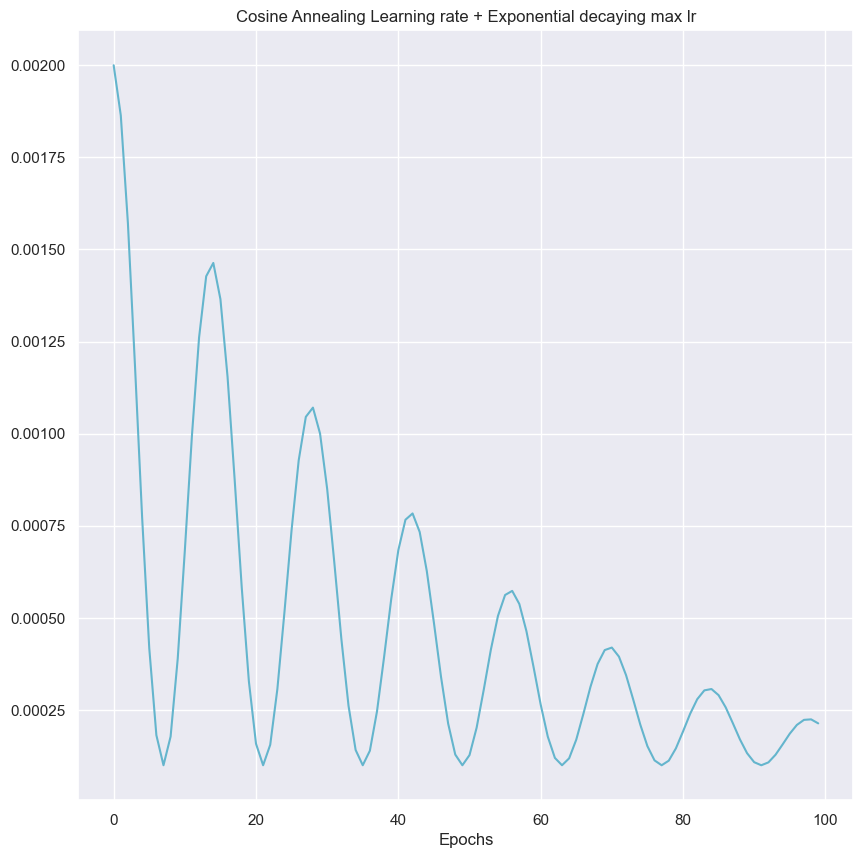

In [41]:
plt.grid('True')
# rcParams['figure.figsize'] = 9,5
T_max=7
eta_max=0.002
eta_min = 0.0001
lr=[]
initial_lrate = eta_max
drop = 0.8
epochs_drop = 10

for epoch in range(100):    
    lr.append(eta_min + (eta_max - eta_min) * (1 + math.cos(math.pi * epoch / T_max)) / 2)
    eta_max = initial_lrate * math.pow(drop, (1+epoch)/epochs_drop)
lr = np.array(lr)
plt.xlabel("Epochs")
plt.title("Cosine Annealing Learning rate + Exponential decaying max lr")
plt.plot(lr, 'c')

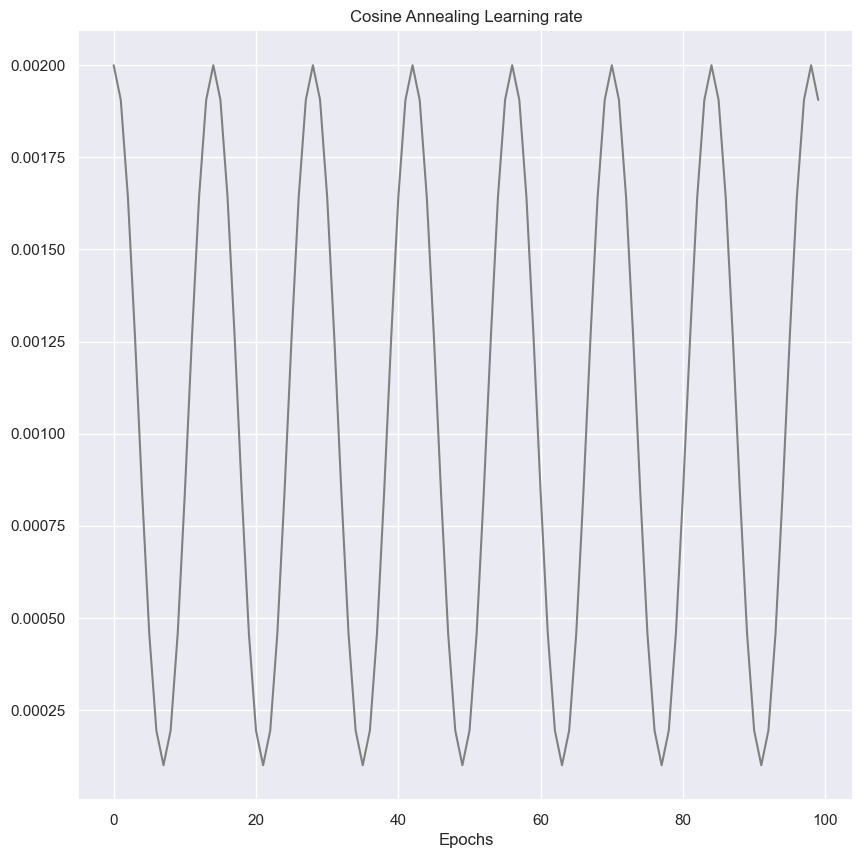

In [42]:
plt.grid('True')
# rcParams['figure.figsize'] = 9,5
T_max=7
eta_max=0.002
eta_min = 0.0001
lr=[]
for epoch in range(100):    
    lr.append(eta_min + (eta_max - eta_min) * (1 + math.cos(math.pi * epoch / T_max)) / 2)
lr = np.array(lr)
plt.xlabel("Epochs")
plt.title("Cosine Annealing Learning rate")
plt.plot(lr, 'grey')

In [43]:
batch_size = 16 #reduced from original 32 because of memory issues
epochs = 80
#lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=7, verbose=1)
filepath_dice_coeff="unet_covid_weights_dice_coeff.hdf5"
filepath_loss = "unet_covid_weights_val_loss.hdf5"
checkpoint_dice = ModelCheckpoint(filepath_dice_coeff, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
checkpoint_loss = ModelCheckpoint(filepath_loss, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

In [44]:
model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice_coeff])

In [45]:
results = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(x_valid, y_valid),
                    callbacks = [checkpoint_dice, checkpoint_loss
                                 , cosine_annealer])


Epoch 00001: CosineAnnealingScheduler setting learning rate to 0.0005.
Epoch 1/80
80/80 [==============================] - ETA: 0s - loss: 0.4032 - dice_coeff: 0.3928
Epoch 1: val_dice_coeff improved from -inf to 0.00056, saving model to unet_covid_weights_dice_coeff.hdf5

Epoch 1: val_loss improved from inf to 1.04241, saving model to unet_covid_weights_val_loss.hdf5
80/80 [==============================] - 53s 393ms/step - loss: 0.4032 - dice_coeff: 0.3928 - val_loss: 1.0424 - val_dice_coeff: 5.5631e-04 - lr: 5.0000e-04

Epoch 00002: CosineAnnealingScheduler setting learning rate to 0.0004801937735804838.
Epoch 2/80
80/80 [==============================] - ETA: 0s - loss: 0.2814 - dice_coeff: 0.5921
Epoch 2: val_dice_coeff improved from 0.00056 to 0.00348, saving model to unet_covid_weights_dice_coeff.hdf5

Epoch 2: val_loss improved from 1.04241 to 0.88711, saving model to unet_covid_weights_val_loss.hdf5
80/80 [==============================] - 25s 308ms/step - loss: 0.2814 - dice

In [47]:
# Clear memory
gc.collect()

23

## Saving the model we just created

In [57]:
# Save as a .h5 file
model.save_weights('unet_0.8688_cosine_annealer.h5')
print("Saving weights to disk")

In [95]:
# Saving model as .h5 file
model.save('uneth_0.8688_2D_Model.h5')
print("Saving model to disk")

Saving model to disk


In [94]:
#Saving as a json file
model_json = model.to_json()
with open("unet_0.8688_cosine_annealer.json","w") as json_file:
     json_file.write(model_json)

In [102]:
import json

In [116]:
config=model.get_config()
with open("unet_0.8688_config.json","w") as json_file:
     json.dump(config, json_file)

## Loading the model we created

In [49]:
def create_model():
    inputs = Input((new_dim, new_dim, 1))

    c1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (inputs)
    c1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c1)
    c1 = BatchNormalization()(c1)
    p1 = MaxPooling2D((2, 2)) (c1)
    p1 = Dropout(0.25)(p1)

    c2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p1)
    c2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c2)
    c2 = BatchNormalization()(c2)
    p2 = MaxPooling2D((2, 2)) (c2)
    p2 = Dropout(0.25)(p2)

    c3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p2)
    c3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c3)
    c3 = BatchNormalization()(c3)
    p3 = MaxPooling2D((2, 2)) (c3)
    p3 = Dropout(0.25)(p3)

    c4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p3)
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c4)
    c4 = BatchNormalization()(c4)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
    p4 = Dropout(0.25)(p4)

    c5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p4)
    c5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c5)

    u6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    u6 = BatchNormalization()(u6)
    c6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u6)
    c6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c6)


    u7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c3])
    u7 = BatchNormalization()(u7)
    c7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u7)
    c7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c7)


    u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    u8 = BatchNormalization()(u8)
    c8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u8)
    c8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c8)


    u9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    u9 = BatchNormalization()(u9)
    c9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u9)
    c9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c9)

    outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    print(model.summary())
    return model

In [ ]:
#Downloading said file from google colab
files.download("unet_0.8688_cosine_annealer.json")

In [97]:
#Loading model from file on computer

filepath_dice_coeff="unet_covid_weights_dice_coeff.hdf5"
filepath_loss = "unet_covid_weights_val_loss.hdf5"
checkpoint_dice = ModelCheckpoint(filepath_dice_coeff, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
checkpoint_loss = ModelCheckpoint(filepath_loss, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

model=keras.models.load_model('uneth_0.8688_2D_Model.h5')
model.load_weights(filepath_dice_coeff)
model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice_coeff])


ValueError: Unknown loss function: bce_dice_loss. Please ensure this object is passed to the `custom_objects` argument. See https://www.tensorflow.org/guide/keras/save_and_serialize#registering_the_custom_object for details.

In [62]:
# Clears memory in case we have an OOM error
gc.collect()

4583

In [63]:
batch_size = 16
epochs = 
results = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(x_valid, y_valid),
                    callbacks = [checkpoint_dice, checkpoint_loss
                                 , cosine_annealer])


Epoch 00001: CosineAnnealingScheduler setting learning rate to 0.0005.
Epoch 1/30
80/80 [==============================] - ETA: 0s - loss: 0.0532 - f1-score: 0.9270 - iou_score: 0.8640WARNING:tensorflow:Can save best model only with val_dice_coeff available, skipping.

Epoch 1: val_loss did not improve from 0.10199
80/80 [==============================] - 22s 273ms/step - loss: 0.0532 - f1-score: 0.9270 - iou_score: 0.8640 - val_loss: 0.1039 - val_f1-score: 0.8697 - val_iou_score: 0.7700 - lr: 5.0000e-04

Epoch 00002: CosineAnnealingScheduler setting learning rate to 0.0004801937735804838.
Epoch 2/30
80/80 [==============================] - ETA: 0s - loss: 0.0503 - f1-score: 0.9312 - iou_score: 0.8714WARNING:tensorflow:Can save best model only with val_dice_coeff available, skipping.

Epoch 2: val_loss improved from 0.10199 to 0.10138, saving model to unet_covid_weights_val_loss.hdf5
80/80 [==============================] - 23s 283ms/step - loss: 0.0503 - f1-score: 0.9312 - iou_score:

## Evaluating our model

In [48]:
score = model.evaluate(x_valid, y_valid, batch_size=16)
print("test loss, test dice coefficient:", score)

34/34 [==============================] - 5s 72ms/step - loss: 0.1043 - dice_coeff: 0.8687
test loss, test dice coefficient: [0.10434101521968842, 0.8687147498130798]


In [49]:
results.history.keys()

dict_keys(['loss', 'dice_coeff', 'val_loss', 'val_dice_coeff', 'lr'])

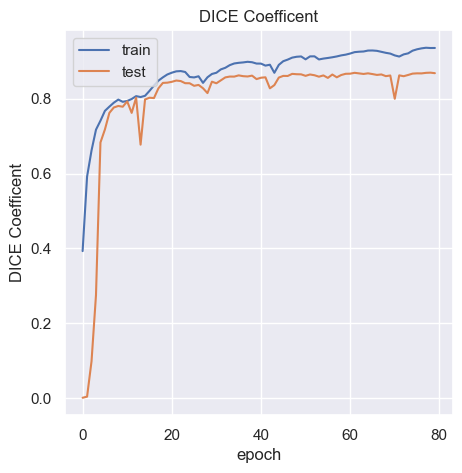

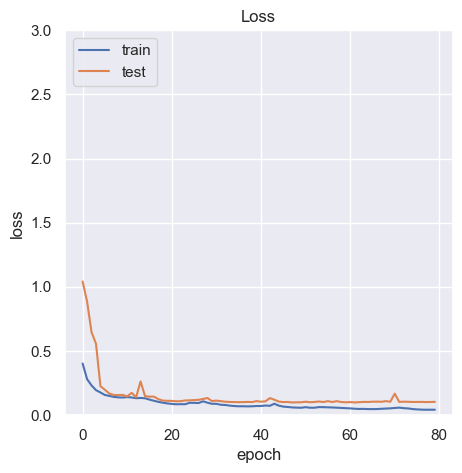

In [50]:
rcParams['figure.figsize'] = 5, 5
plt.plot(results.history['dice_coeff'])
plt.plot(results.history['val_dice_coeff'])
plt.title('DICE Coefficent')
plt.ylabel('DICE Coefficent')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.ylim(0, 3)
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [51]:
plt.rcParams["axes.grid"] = False

In [52]:
def compare_actual_and_predicted(image_no):
    temp = model.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))

    fig = plt.figure(figsize=(15,15))

    plt.subplot(1,3,1)
    plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
    plt.title('Original Image (CT)')

    plt.subplot(1,3,2)
    plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
    plt.title('Actual mask')

    plt.subplot(1,3,3)
    plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
    plt.title('Predicted mask')

    plt.show()
    
# plt.imshow(temp.reshape(img_size, img_size), cmap = 'bone')
# plt.imshow(infections_scaled[120].reshape(img_size, img_size), cmap ='summer')

1/1 [==============================] - 4s 4s/step


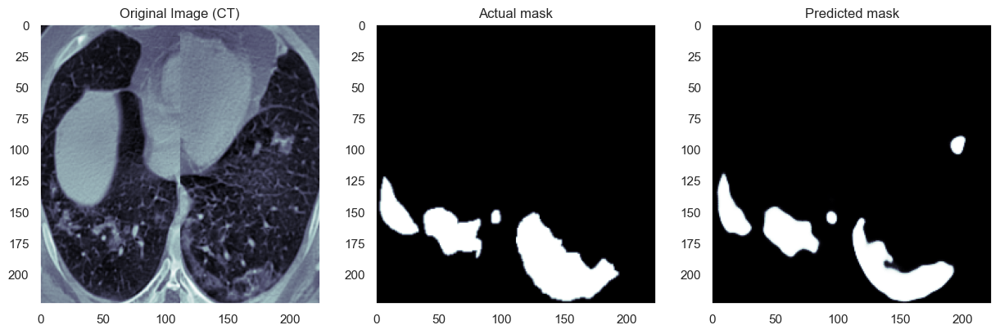

1/1 [==============================] - 2s 2s/step


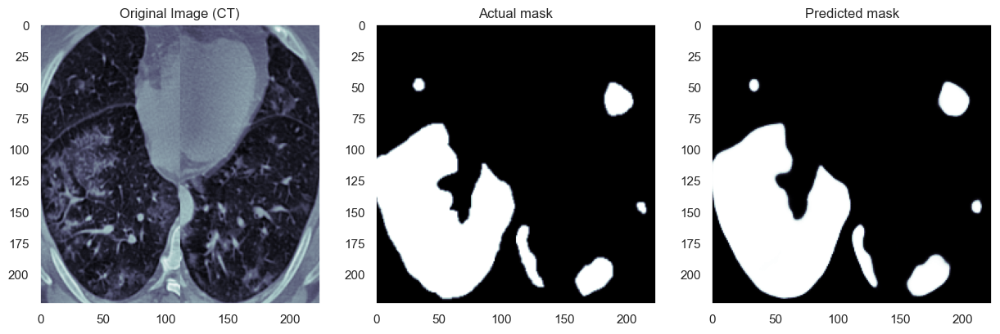

1/1 [==============================] - 1s 759ms/step


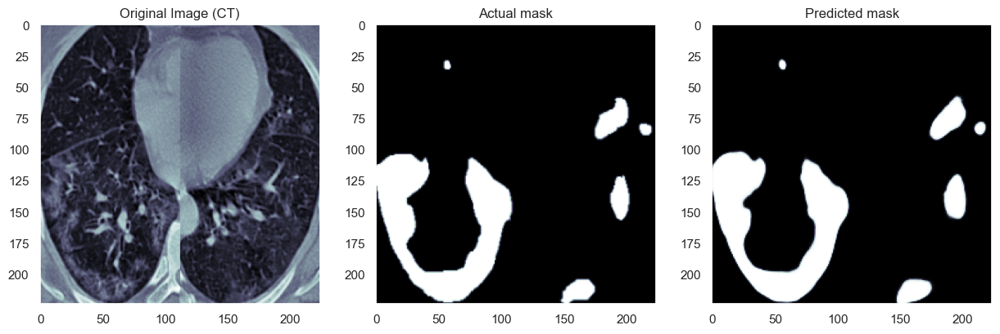

1/1 [==============================] - 1s 763ms/step


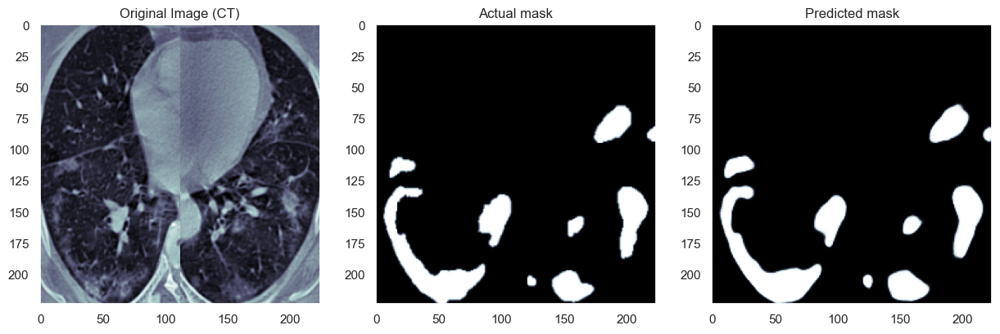

1/1 [==============================] - 1s 750ms/step


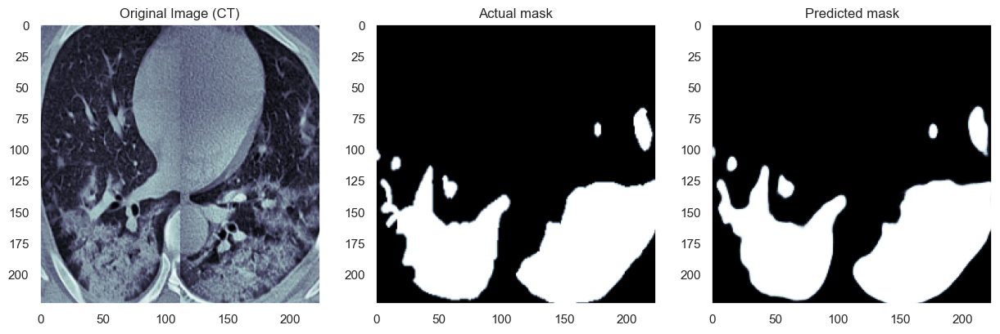

1/1 [==============================] - 1s 757ms/step


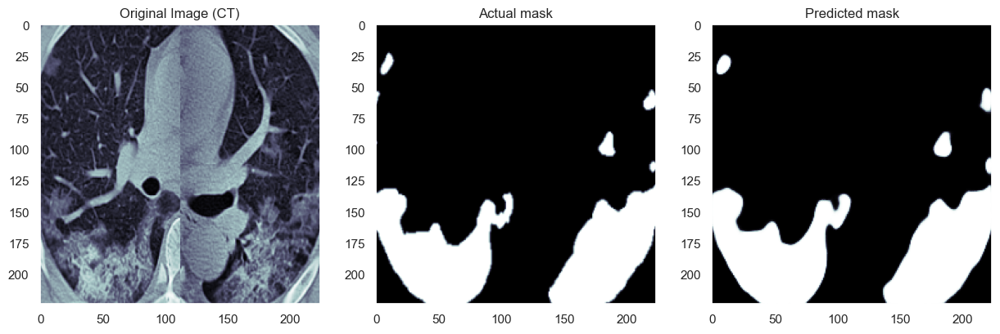

1/1 [==============================] - 1s 751ms/step


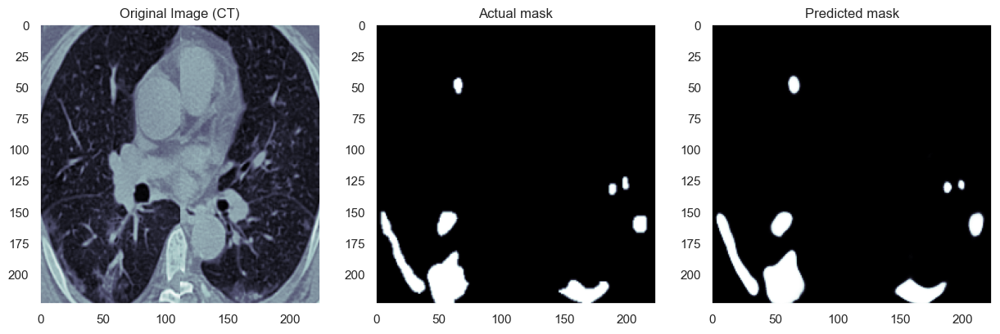

In [53]:
for i in [30, 40, 50, 55, 355, 380, 90]:
    compare_actual_and_predicted(i)

In [54]:
# Clear memory
gc.collect()

67048

1/1 [==============================] - 2s 2s/step


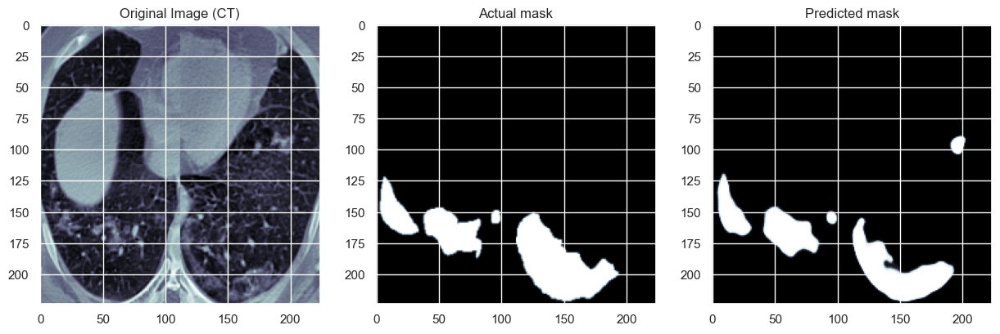

In [123]:
image_no=30
temp = model.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))

fig = plt.figure(figsize=(15,15))

plt.subplot(1,3,1)
plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
plt.title('Original Image (CT)')

plt.subplot(1,3,2)
plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
plt.title('Actual mask')

plt.subplot(1,3,3)
plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
plt.title('Predicted mask')

plt.show()

In [125]:
fig.savefig('./output/prediction_image_1.png')

1/1 [==============================] - 2s 2s/step


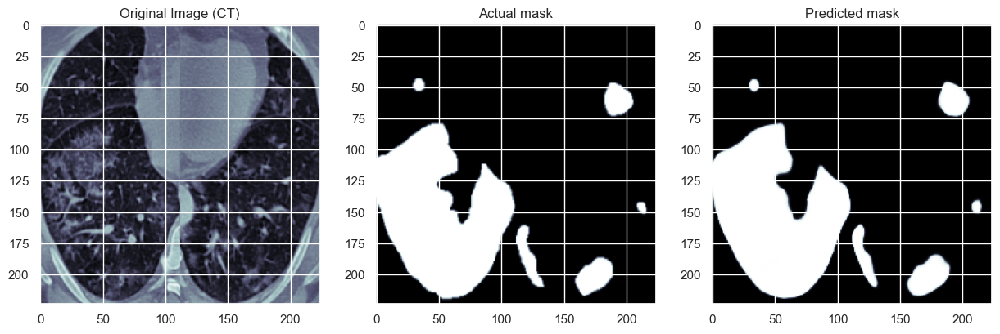

In [126]:
image_no=40
temp = model.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))

fig = plt.figure(figsize=(15,15))

plt.subplot(1,3,1)
plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
plt.title('Original Image (CT)')

plt.subplot(1,3,2)
plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
plt.title('Actual mask')

plt.subplot(1,3,3)
plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
plt.title('Predicted mask')

plt.show()
fig.savefig('./output/prediction_image_2.png')

1/1 [==============================] - 2s 2s/step


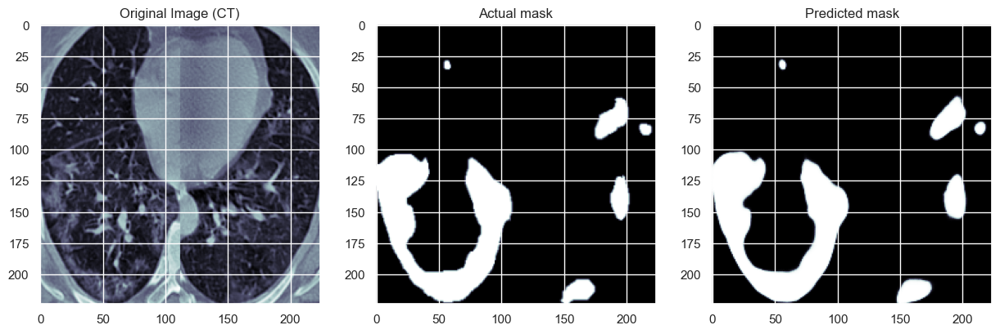

In [127]:
image_no=50
temp = model.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))

fig = plt.figure(figsize=(15,15))

plt.subplot(1,3,1)
plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
plt.title('Original Image (CT)')

plt.subplot(1,3,2)
plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
plt.title('Actual mask')

plt.subplot(1,3,3)
plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
plt.title('Predicted mask')

plt.show()
fig.savefig('./output/prediction_image_3.png')

In [55]:
dices=[]
ious=[]
the_range = np.arange(0.10,0.80, 0.05)

for t in the_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice, iou])
    score = model.evaluate(x_valid, y_valid, batch_size=16)
    dices.append(score[1])
    ious.append(score[2])

34/34 [==============================] - 6s 74ms/step - loss: 0.1043 - f1-score: 0.8717 - iou_score: 0.7732


In [56]:
print('DICES:',dices)
print("IOUS:",ious)
print("Best Threshold:", the_range[np.argmax(dices)])
print("Best dice score:", dices[np.argmax(dices)])
print("Best iou score:", ious[np.argmax(ious)])

DICES: [0.8684215545654297, 0.8700340986251831, 0.8708687424659729, 0.8714444041252136, 0.8718096613883972, 0.8720337748527527, 0.8722043633460999, 0.8723399043083191, 0.872408926486969, 0.8724143505096436, 0.8723719716072083, 0.8722535371780396, 0.872079610824585, 0.8717397451400757]
IOUS: [0.7678889036178589, 0.7704192996025085, 0.7717357277870178, 0.7726458311080933, 0.7732247114181519, 0.7735831141471863, 0.773856520652771, 0.7740722298622131, 0.7741846442222595, 0.7741963267326355, 0.7741348147392273, 0.773953914642334, 0.7736868262290955, 0.7731615900993347]
Best Threshold: 0.5500000000000002
Best dice score: 0.8724143505096436
Best iou score: 0.7741963267326355


Best Threshold: 0.5500000000000002


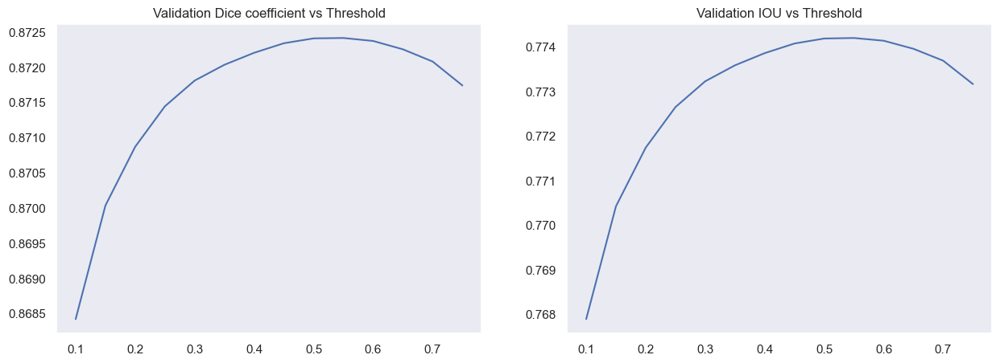

In [57]:
print("Best Threshold:", the_range[np.argmax(dices)])
fig = plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(the_range, dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_range, ious)
plt.title("Validation IOU vs Threshold")

plt.show()

In [128]:
gc.collect()

84104

In [129]:
the_new_range = np.arange(0.52,0.60, 0.0075)
new_dices=[]
new_ious=[]

for t in the_new_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice, iou])
    score = model.evaluate(x_valid, y_valid, batch_size=16)
    new_dices.append(score[1])
    new_ious.append(score[2])

34/34 [==============================] - 6s 74ms/step - loss: 0.1043 - f1-score: 0.8724 - iou_score: 0.7741


In [130]:
print("We just checked for",len(the_new_range), "steps between 0.52 and 0.60")

We just checked for 11 steps between 0.52 and 0.60


In [131]:
print('NEW DICES:',new_dices)
print("NEW IOUS:",new_ious)
print("New Best Threshold:", the_new_range[np.argmax(new_dices)])
print("Best new dice score:", new_dices[np.argmax(new_dices)])
print("Best new iou score:", new_ious[np.argmax(new_ious)])

NEW DICES: [0.8723958730697632, 0.8724035024642944, 0.8724102973937988, 0.8724094033241272, 0.8724143505096436, 0.8724117875099182, 0.8723993897438049, 0.8723982572555542, 0.8723897337913513, 0.8723709583282471, 0.8723611235618591]
NEW IOUS: [0.7741655707359314, 0.7741777300834656, 0.7741875648498535, 0.7741875648498535, 0.7741963267326355, 0.7741933465003967, 0.7741745114326477, 0.7741734981536865, 0.7741606831550598, 0.7741314172744751, 0.7741171717643738]
New Best Threshold: 0.5499999999999998
Best new dice score: 0.8724143505096436
Best new iou score: 0.7741963267326355


Best Threshold: 0.5499999999999998


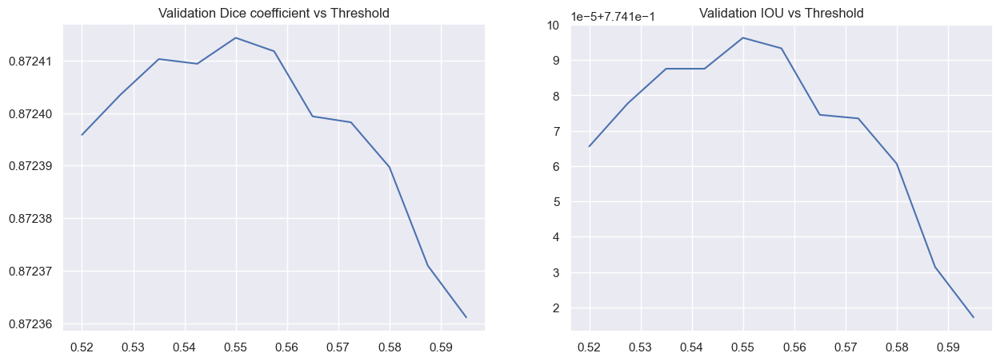

In [132]:
print("Best Threshold:", the_new_range[np.argmax(new_dices)])
fig = plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(the_new_range, new_dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_new_range, new_ious)
plt.title("Validation IOU vs Threshold")

plt.show()
fig.savefig('./output/DICE_vs_IOU.png')

In [133]:
gc.collect()

18841

In [134]:
the_prec_rec_range = np.arange(0,1, 0.09)
precisions=[]
recalls=[]

for t in the_prec_rec_range:
    precision = sm.metrics.Precision(threshold=t)
    recall = sm.metrics.Recall(threshold=t)
    model.compile(optimizer=Adam(lr = 0.0005), loss=bce_dice_loss, metrics=[precision, recall])
    score = model.evaluate(x_valid, y_valid, batch_size=16)
    precisions.append(score[1])
    recalls.append(score[2])

C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


34/34 [==============================] - 6s 76ms/step - loss: 0.1043 - precision: 0.9384 - recall: 0.7645


In [135]:
print('PRECISIONS:',precisions)
print("RRECALLS:",recalls)
print("Best Threshold for Precision:", the_prec_rec_range[np.argmax(precisions)])
print("Best Threshold for Recall:", the_prec_rec_range[np.argmax(recalls)])
print("Best precision score:", precisions[np.argmax(precisions)])
print("Best recall score:", recalls[np.argmax(recalls)])

PRECISIONS: [0.06657201051712036, 0.8333603739738464, 0.8474846482276917, 0.8551083207130432, 0.8606641888618469, 0.8656569123268127, 0.8703108429908752, 0.8750973343849182, 0.8804171085357666, 0.8869913220405579, 0.8972559571266174, 0.9383972883224487]
RRECALLS: [1.0, 0.9059964418411255, 0.8955472111701965, 0.8893634676933289, 0.8843538761138916, 0.8797078132629395, 0.8751012682914734, 0.8701010942459106, 0.8642454743385315, 0.8563971519470215, 0.8429371118545532, 0.7644803524017334]
Best Threshold for Precision: 0.99
Best Threshold for Recall: 0.0
Best precision score: 0.9383972883224487
Best recall score: 1.0


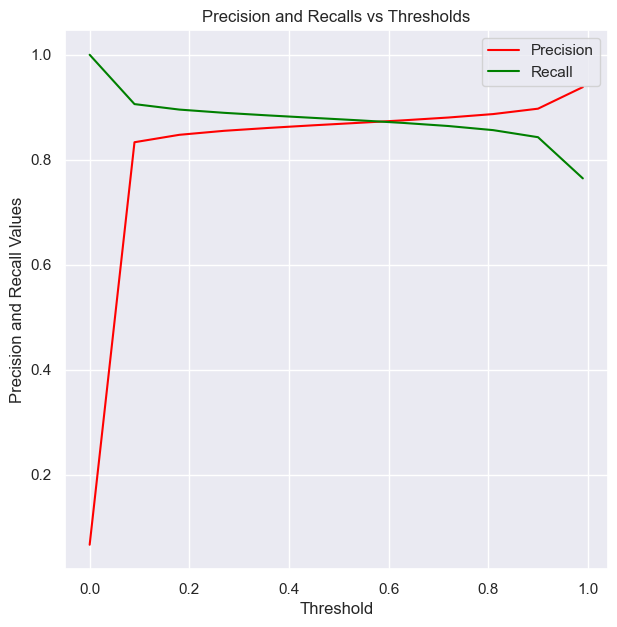

In [138]:
fig = plt.figure(figsize=(7,7))
plt.rcParams["axes.grid"] = True
plt.title("Precision and Recalls vs Thresholds")
plt.xlabel('Threshold')
plt.ylabel('Precision and Recall Values')
plt.plot(the_prec_rec_range,precisions, color='red')
plt.plot(the_prec_rec_range, recalls, color='green')
plt.legend(['Precision', 'Recall'])
plt.show()
fig.savefig('./output/percision_and_recall.png')

In [137]:
gc.collect()

13880

In [139]:
from sklearn.utils import class_weight

In [140]:
def recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1(y_true, y_pred):
    precision_t = precision(y_true, y_pred)
    recall_t = recall(y_true, y_pred)
    return 2*((precision_t*recall_t)/(precision_t+recall_t+K.epsilon()))


class RocCallback(Callback):
    def __init__(self,training_data,validation_data):
        self.x = training_data[0]
        self.y = training_data[1]
        self.x_val = validation_data[0]
        self.y_val = validation_data[1]


    def on_train_begin(self, logs={}):
        return

    def on_train_end(self, logs={}):
        return

    def on_epoch_begin(self, epoch, logs={}):
        return

    def on_epoch_end(self, epoch, logs={}):
        global best_val_auc
        global model
        y_pred_train = self.model.predict_proba(self.x)
        roc_train = roc_auc_score(self.y, y_pred_train)
        y_pred_val = self.model.predict_proba(self.x_val)
        roc_val = roc_auc_score(self.y_val, y_pred_val)
        print('\rroc-auc_train: %s - roc-auc_val: %s' % (str(round(roc_train,4)),str(round(roc_val,4))),end=100*' '+'\n')
        if best_val_auc < roc_val:
            best_val_auc = roc_val
            model.save_weights('best_val_auc_weights.h5')
            print("Saving best validation AUC weights")
        return

    def on_batch_begin(self, batch, logs={}):
        return

    def on_batch_end(self, batch, logs={}):
        return

In [141]:
weights = class_weight.compute_class_weight('balanced',
                                            classes=np.unique(y_train),
                                            y=y_train)
print(weights)

TypeError: unhashable type: 'numpy.ndarray'

(1267, 224, 224, 1)

### 3D CNN

In [51]:
model = models.Sequential()
model.add(layers.Conv3D(32, (3, 3, 3), activation='relu', input_shape=(224, 224, 224, 1)))
model.add(layers.MaxPooling3D((2, 2, 2)))
model.add(layers.Conv3D(64, (3, 3, 3), activation='relu'))
model.add(layers.MaxPooling3D((2, 2, 2)))
model.add(layers.Conv3D(64, (3, 3, 3), activation='relu'))
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_4 (Conv3D)           (None, 222, 222, 222, 32  896       
                             )                                   
                                                                 
 max_pooling3d (MaxPooling3D  (None, 111, 111, 111, 32  0        
 )                           )                                   
                                                                 
 conv3d_5 (Conv3D)           (None, 109, 109, 109, 64  55360     
                             )                                   
                                                                 
 max_pooling3d_1 (MaxPooling  (None, 54, 54, 54, 64)   0         
 3D)                                                             
                                                                 
 conv3d_6 (Conv3D)           (None, 52, 52, 52, 64)   

In [ ]:
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(3)) # Three outputs should be good for COVID, Pmeumonia and Healthy
model.summary()


In [ ]:
# Adam is the best among the adaptive optimizers in most of the cases
model.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=[tf.keras.metrics.BinaryAccuracy(),tf.keras.metrics.FalseNegatives()])

# An epoch means training the neural network with all the
# training data for one cycle. Here I use 15 epochs
history = model.fit(x_train, y_train, epochs=15, 
                    validation_data=(x_valid, y_valid))# Adam is the best among the adaptive optimizers in most of the cases
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# An epoch means training the neural network with all the
# training data for one cycle. Here I use 10 epochs
history = model.fit(x_train, y_train, epochs=10, 
                    validation_data=(X_test, y_test))

### Kmeans Clustering

### Random Forrest

# References:

**Data sources**

[1] - Paiva, O., 2020. CORONACASES.ORG - Helping Radiologists To Help People In More Than 100 Countries! | Coronavirus Cases - 冠状病毒病例. [online] Coronacases.org. Available at: <link> [Accessed 20 March 2020].

[2] - Glick, Y., 2020. Viewing Playlist: COVID-19 Pneumonia | Radiopaedia.Org. [online] Radiopaedia.org. Available at: <link> [Accessed 20 April 2020].

**Expert Annotations**

[3] - Ma Jun, Ge Cheng, Wang Yixin, An Xingle, Gao Jiantao, Yu Ziqi, … He Jian. (2020). COVID-19 CT Lung and Infection Segmentation Dataset (Version Verson 1.0) [Data set]. Zenodo. DOI

**Notbooks**

Kaggle COVID-19 Lung infections getting started notebook<br>
https://www.kaggle.com/code/andrewmvd/covid-19-ct-scans-getting-started/notebook

Deadskul7's Infection plus lung segmentation notebook<br>
https://github.com/deadskull7/One-Stop-for-COVID-19-Infection-and-Lung-Segmentation-plus-Classification
